In [1]:
import pandas as pd
import numpy as np
from IPython.display import display, Markdown, Latex

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

import wrangle_zillow
import modeling
from wrangle import clean_zillow, summarize, split_data_continuous
from viz import get_viz
from viz import boxplots, hists, heatmaps, slicer, haversine

import scipy.stats as stats

from sklearn.preprocessing import MinMaxScaler, RobustScaler
from sklearn.cluster import KMeans

import warnings
warnings.filterwarnings("ignore")

# Acquire

In [2]:
df = clean_zillow()

df.info()

Number of observations removed: 9964
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41067 entries, 0 to 41066
Data columns (total 25 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   id                    41067 non-null  int64         
 1   parcel                41067 non-null  int64         
 2   logerror              41067 non-null  float64       
 3   trans_date            41067 non-null  datetime64[ns]
 4   bathrooms             41067 non-null  object        
 5   bedrooms              41067 non-null  object        
 6   tot_sqft              41067 non-null  float64       
 7   fips                  41067 non-null  object        
 8   hot_tub               41067 non-null  float64       
 9   lat                   41067 non-null  float64       
 10  lon                   41067 non-null  float64       
 11  lot_sqft              41067 non-null  float64       
 12  pools                 41067 non-null 

# Prepare

In [3]:
df['house_age_bin'] = pd.cut(df.house_age, 
                           bins = [0, 5, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140],
                           labels = [0, .066, .133, .20, .266, .333, .40, .466, .533, 
                                     .60, .666, .733, .8, .866, .933])

df['taxrate'] = df.tax_amount/df.tax_value*100

df['acres'] = df.lot_sqft/ 43560

df['acres_bin'] = pd.cut(df.acres, bins = [0, .10, .15, .25, .5, 1, 5, 10, 20, 50, 200], 
                       labels = [0, .1, .2, .3, .4, .5, .6, .7, .8, .9])

df['tot_sqft_bin'] = pd.cut(df.tot_sqft, 
                            bins = [0, 800, 1000, 1250, 1500, 2000, 2500, 3000, 4000, 7000, 12000],
                            labels = [0, .1, .2, .3, .4, .5, .6, .7, .8, .9]
                       )

df['structure_dollar_per_sqft'] = df.building_tax_value / df.tot_sqft

df['structure_dollar_sqft_bin'] = pd.cut(df.structure_dollar_per_sqft, 
                                             bins = [0, 25, 50, 75, 100, 150, 200, 300, 500, 1000, 1500],
                                             labels = [0, .1, .2, .3, .4, .5, .6, .7, .8, .9]
                                            )

df['land_dollar_per_sqft'] = df.land_tax_value / df.lot_sqft

df['land_dollar_sqft_bin'] = pd.cut(df.land_dollar_per_sqft, bins = [0, 1, 5, 20, 50, 100, 250, 500, 1000, 1500, 2000],
                                       labels = [0, .1, .2, .3, .4, .5, .6, .7, .8, .9]
                                      )

df = df.astype({'tot_sqft_bin': 'float64', 'acres_bin': 'float64', 'house_age_bin': 'float64',
                    'structure_dollar_sqft_bin': 'float64', 'land_dollar_sqft_bin': 'float64'})


df.bedrooms = df.bedrooms.map({'_4_':4, '_3_':3, '_2_': 2, '_5_': 5})

df.bathrooms = df.bathrooms.map({'_4_':4, '_3_':3, '_2_': 2, '_5_': 5, '_1_':1})

df['bed_bath_ratio'] = df.bedrooms/ df.bathrooms

df['incity_la'] = df.city_id.apply(lambda x: 1 if x == 12447 else 0)

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41067 entries, 0 to 41066
Data columns (total 36 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   id                         41067 non-null  int64         
 1   parcel                     41067 non-null  int64         
 2   logerror                   41067 non-null  float64       
 3   trans_date                 41067 non-null  datetime64[ns]
 4   bathrooms                  41067 non-null  int64         
 5   bedrooms                   41067 non-null  int64         
 6   tot_sqft                   41067 non-null  float64       
 7   fips                       41067 non-null  object        
 8   hot_tub                    41067 non-null  float64       
 9   lat                        41067 non-null  float64       
 10  lon                        41067 non-null  float64       
 11  lot_sqft                   41067 non-null  float64       
 12  pool

In [4]:
fips = pd.get_dummies(df.fips)

df = pd.concat([df, fips], axis=1)

In [5]:
df = df.drop(columns= ['bedrooms','tax_amount', 'tax_value','structure_dollar_per_sqft', 'land_dollar_per_sqft', 'lot_sqft','tax_delinquency_flag','land_tax_value','building_tax_value','trans_date','city_id', 'pools', 'hot_tub','zip_code', 'county_landuse', 'tract_and_block', 'half_baths', 'id', 'parcel', 'raw_tract_and_block','fips'])

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41067 entries, 0 to 41066
Data columns (total 18 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   logerror                   41067 non-null  float64
 1   bathrooms                  41067 non-null  int64  
 2   tot_sqft                   41067 non-null  float64
 3   lat                        41067 non-null  float64
 4   lon                        41067 non-null  float64
 5   house_age                  41067 non-null  int64  
 6   house_age_bin              41067 non-null  float64
 7   taxrate                    41067 non-null  float64
 8   acres                      41067 non-null  float64
 9   acres_bin                  41067 non-null  float64
 10  tot_sqft_bin               41067 non-null  float64
 11  structure_dollar_sqft_bin  41067 non-null  float64
 12  land_dollar_sqft_bin       41067 non-null  float64
 13  bed_bath_ratio             41067 non-null  flo

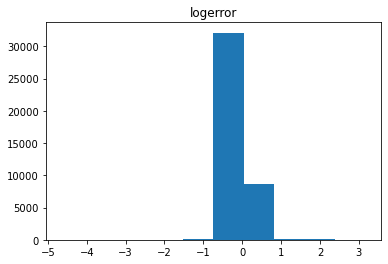

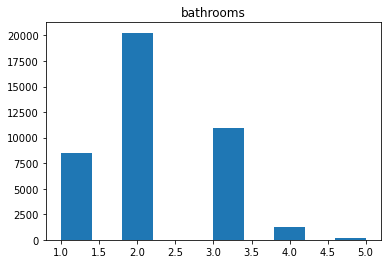

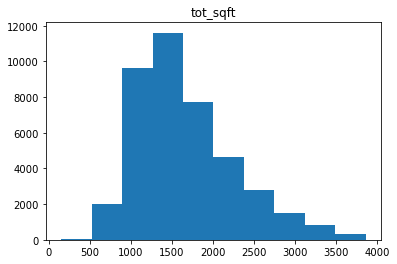

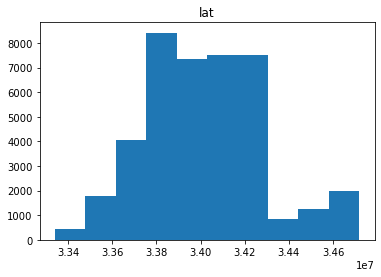

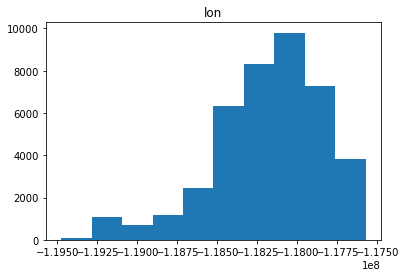

...

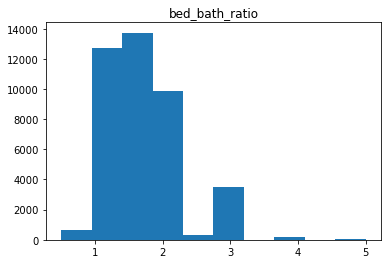

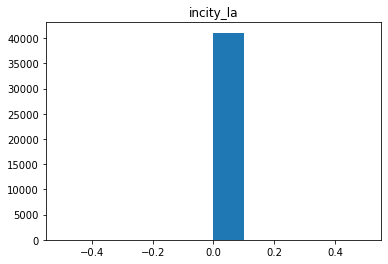

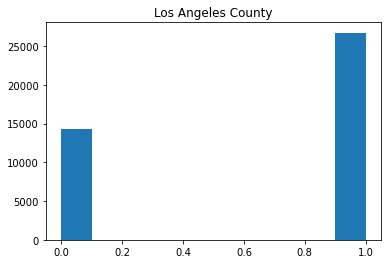

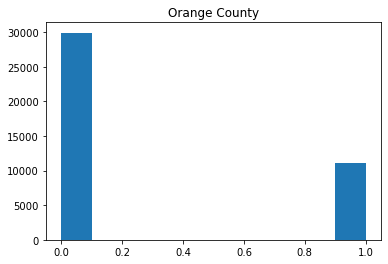

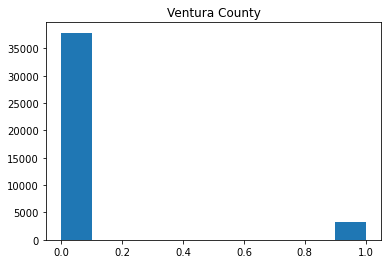

In [7]:
for col in df.columns:
    plt.hist(df[col])
    plt.title(col)
    plt.show()

In [8]:
partitions = wrangle_zillow.split(df, target_var= 'logerror')

In [9]:
train = partitions[0]
train['logerror_bins'] = pd.cut(train.logerror, [-5, -.2, -.05, .05, .2, 4])
partitions[0] = train

In [ ]:
train = partitions[0]
train['logerror_bins'] = pd.cut(train.logerror, [-5, -.2, -.05, .05, .2, 4])
partitions[0] = train

In [10]:
train.logerror_bins.value_counts()

(-0.05, 0.05]    15469
(0.05, 0.2]       3290
(-0.2, -0.05]     2767
(0.2, 4.0]        1010
(-5.0, -0.2]       461
Name: logerror_bins, dtype: int64

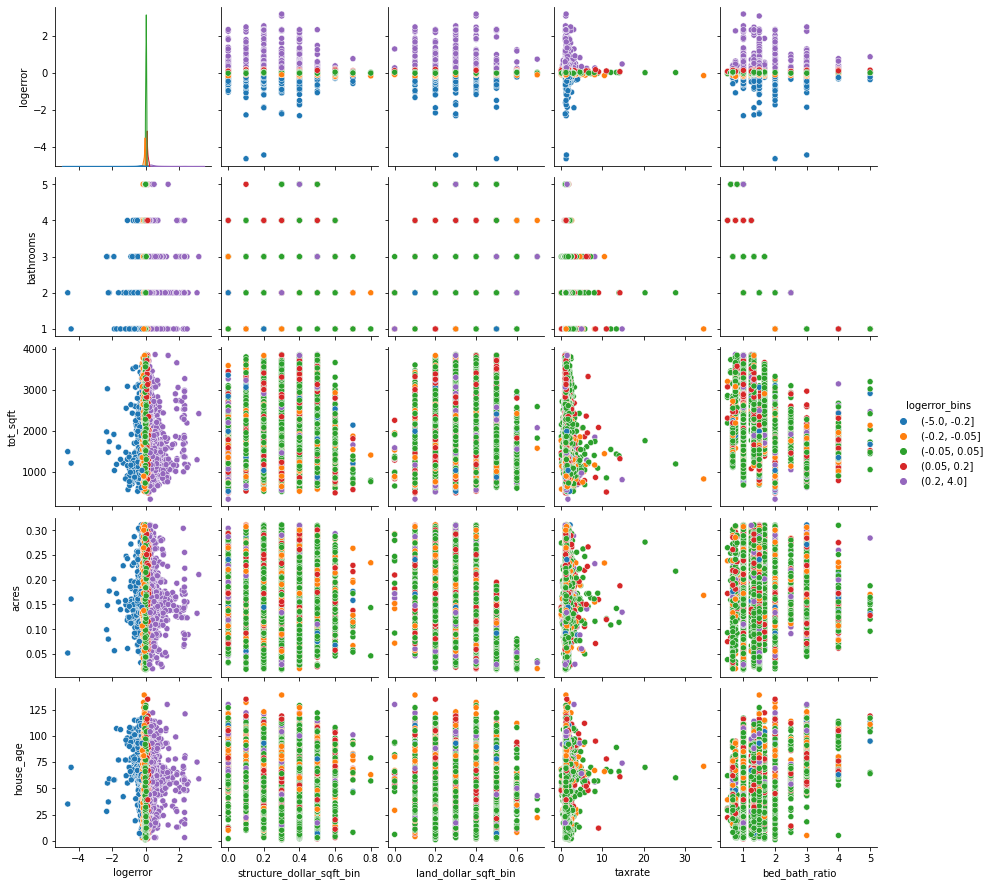

In [11]:
sns.pairplot(data = train, hue = 'logerror_bins', 
             x_vars = ['logerror', 'structure_dollar_sqft_bin', 'land_dollar_sqft_bin', 'taxrate', 
                       'bed_bath_ratio'],
             y_vars = ['logerror', 'bathrooms', 'tot_sqft', 'acres', 'house_age'])

In [12]:
train.columns

Index(['logerror', 'bathrooms', 'tot_sqft', 'lat', 'lon', 'house_age',
       'house_age_bin', 'taxrate', 'acres', 'acres_bin', 'tot_sqft_bin',
       'structure_dollar_sqft_bin', 'land_dollar_sqft_bin', 'bed_bath_ratio',
       'incity_la', 'Los Angeles County', 'Orange County', 'Ventura County',
       'logerror_bins'],
      dtype='object')

In [13]:
# the variables that still need scaling
scaled_vars = ['lat', 'lon', 'bathrooms', 'taxrate']

# create new column names for the scaled variables by adding 'scaled_' to the beginning of each variable name 
scaled_column_names = ['scaled_' + i for i in scaled_vars]

# select the X partitions: [X_train, X_validate, X_test]
X = partitions[1:4]

# fit the minmaxscaler to X_train
X_train = X[0]
scaler = MinMaxScaler(copy=True).fit(X_train[scaled_vars])
X_validate = X[1]



def scale_and_concat(df):
    scaled_array = scaler.transform(df[scaled_vars])
    scaled_df = pd.DataFrame(scaled_array, columns=scaled_column_names, index=df.index.values)
    return pd.concat((df, scaled_df), axis=1)

for i in range(len(X)):
    X[i] = scale_and_concat(X[i])



In [14]:
# recall: X[0] is X_train, X[1] is X_validate and X[2] is X_test
X[0].head()


,bathrooms,tot_sqft,lat,lon,house_age,house_age_bin,taxrate,acres,acres_bin,tot_sqft_bin,...,land_dollar_sqft_bin,bed_bath_ratio,incity_la,Los Angeles County,Orange County,Ventura County,scaled_lat,scaled_lon,scaled_bathrooms,scaled_taxrate
13298,3,2245.0,33600496.0,-117738073.0,23,0.200,0.978716,0.123967,0.1,0.5,...,0.2,1.333333,0,0,1,0,0.188489,0.912905,0.50,0.027677
29471,2,1503.0,34224740.0,-118996997.0,38,0.266,1.106162,0.126079,0.1,0.4,...,0.2,1.500000,0,0,0,1,0.641659,0.251333,0.25,0.031368
21090,3,3385.0,33985164.0,-117913839.0,31,0.266,1.206692,0.170087,0.2,0.7,...,0.4,1.333333,0,1,0,0,0.467739,0.820539,0.50,0.034279
17252,2,2223.0,34033846.0,-118321851.0,96,0.666,1.243105,0.195064,0.2,0.5,...,0.3,1.500000,0,1,0,0,0.503080,0.606126,0.25,0.035334
38210,1,1221.0,33807329.0,-118377626.0,69,0.466,1.160689,0.140840,0.1,0.2,...,0.4,3.000000,0,1,0,0,0.338640,0.576816,0.00,0.032947


# Explore

## How does the acreage affect logerror?

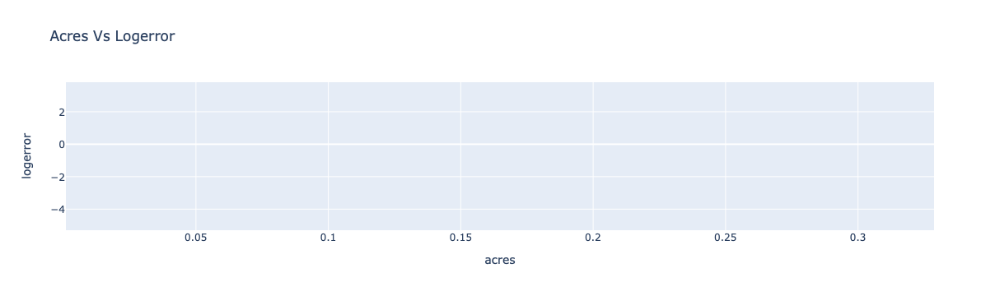

In [15]:
px.scatter(data_frame=train,
                x= train.acres,
                y= 'logerror',
           title = 'Acres Vs Logerror'
               )

### Homes between about .12 and .25 have the greatest amount of error and more positive error than negative error

## Is there a relationship between tax rate and logerror?

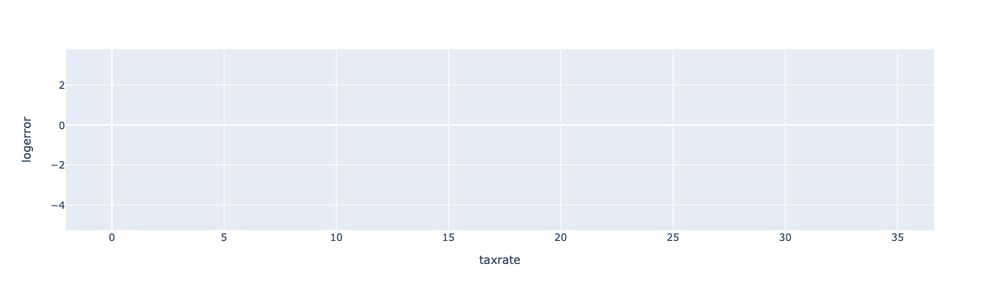

In [16]:
px.scatter(data_frame=train,
                x= train.taxrate,
                y= 'logerror'
               )

## It looks like the higher the Tax Rate, the less the logerror
- We will test this

In [17]:
r, p_value = stats.pearsonr(x= train.taxrate, y= train.logerror)
print(r, p_value)

0.01115005789923605 0.090867295641755


In [18]:
α = .05

if p_value < α:
    print(f'We can REJECT the Null Hₒ: There is no correlation between Tax Rate and Logerror\nWith Correlation coeffiecent of {round(r,2)} and p_value of {round(p_value,3)}')
    
else:
    print('We CANNOT reject thr Null Hₒ: There is no correlation between Tax Rate and Logerror')

We CANNOT reject thr Null Hₒ: There is no correlation between Tax Rate and Logerror


## How does the age of properties effect logerror?

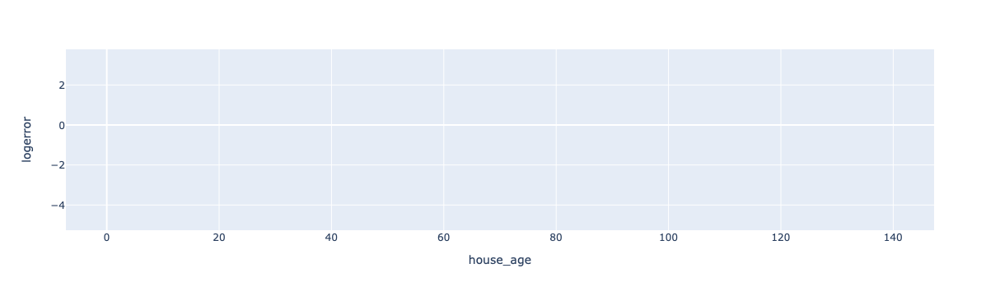

In [19]:
px.scatter(data_frame=train,
                x= train.house_age,
                y= train.logerror,
               )

## Seems like error is greatest amongst homes that fall between about 40 and 80 years of age with it being more on the positive end

## How does structure dollar/sqft and land dollar/sqft affect logerror and are the two features similar?

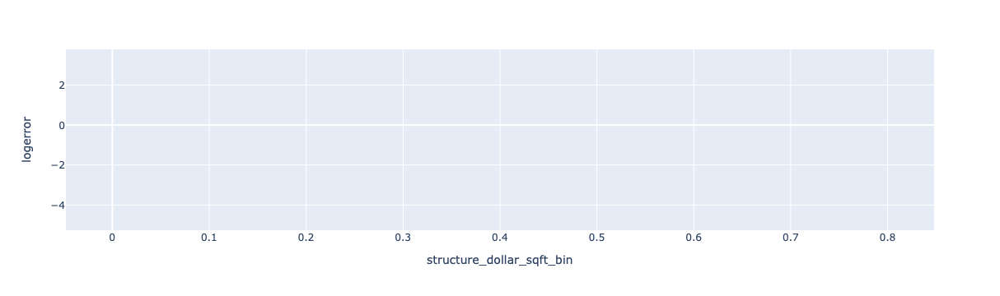

In [20]:
px.scatter(data_frame=train,
                x= train.structure_dollar_sqft_bin,
                y= train.logerror,
               )

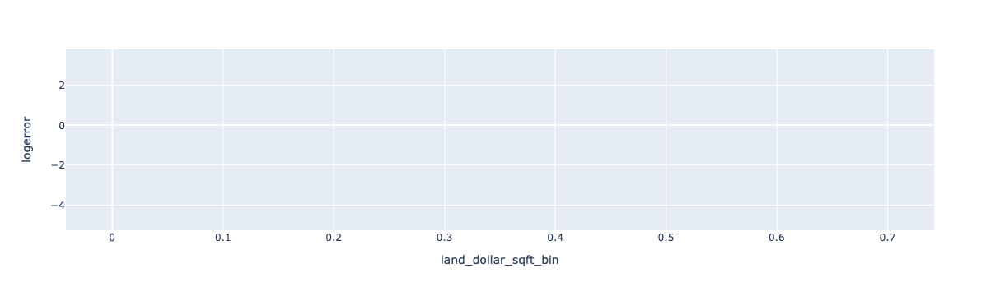

In [21]:
px.scatter(data_frame=train,
                x= train.land_dollar_sqft_bin,
                y= train.logerror,
               )

### The more dollars in land and structure per area the less error there is.  Both land dollar and structure dollar features seem to be similar in how they correlate with logerror....let's test it

In [42]:
r, p_value = stats.pearsonr(x= train.structure_dollar_per_sqft, y= train.logerror)
print('Structure Dollars')
print(r, p_value)
print()

α = .05

if p_value < α:
    print(f'We can REJECT the Null Hₒ: There is no correlation between Tax Rate and Logerror\nWith Correlation coeffiecent of {round(r,2)} and p_value of {round(p_value,3)}')
    
else:
    print('We CANNOT reject thr Null Hₒ: There is no correlation between Tax Rate and Logerror')
    

r, p_value = stats.pearsonr(x= train.land_dollar_per_acre, y= train.logerror)
print()
print('Land Dollars')
print(r, p_value)
print()

if p_value < α:
    print(f'We can REJECT the Null Hₒ: There is no correlation between Tax Rate and Logerror\nWith Correlation coeffiecent of {round(r,2)} and p_value of {round(p_value,3)}')
    
else:
    print('We CANNOT reject thr Null Hₒ: There is no correlation between Tax Rate and Logerror')

Structure Dollars
-0.04302662101303796 6.685300941497077e-11

We can REJECT the Null Hₒ: There is no correlation between Tax Rate and Logerror
With Correlation coeffiecent of -0.04 and p_value of 0.0

Land Dollars
-0.011934164126572193 0.07033400191973728

We CANNOT reject thr Null Hₒ: There is no correlation between Tax Rate and Logerror


In [22]:
# list of variables I will cluster on. 
cluster_vars = ['scaled_lat', 'scaled_lon', 'house_age_bin']
cluster_name = 'area_cluster'
k_range = range(2,20)


In [23]:
def find_k(X_train, cluster_vars, k_range):
    sse = []
    for k in k_range:
        kmeans = KMeans(n_clusters=k)

        # X[0] is our X_train dataframe..the first dataframe in the list of dataframes stored in X. 
        kmeans.fit(X_train[cluster_vars])

        # inertia: Sum of squared distances of samples to their closest cluster center.
        sse.append(kmeans.inertia_) 

    # compute the difference from one k to the next
    delta = [round(sse[i] - sse[i+1],0) for i in range(len(sse)-1)]

    # compute the percent difference from one k to the next
    pct_delta = [round(((sse[i] - sse[i+1])/sse[i])*100, 1) for i in range(len(sse)-1)]

    # create a dataframe with all of our metrics to compare them across values of k: SSE, delta, pct_delta
    k_comparisons_df = pd.DataFrame(dict(k=k_range[0:-1], 
                             sse=sse[0:-1], 
                             delta=delta, 
                             pct_delta=pct_delta))

    # plot k with inertia
    plt.plot(k_comparisons_df.k, k_comparisons_df.sse, 'bx-')
    plt.xlabel('k')
    plt.ylabel('SSE')
    plt.title('The Elbow Method to find the optimal k\nFor which k values do we see large decreases in SSE?')
    plt.show()

    # plot k with pct_delta
    plt.plot(k_comparisons_df.k, k_comparisons_df.pct_delta, 'bx-')
    plt.xlabel('k')
    plt.ylabel('Percent Change')
    plt.title('For which k values are we seeing increased changes (%) in SSE?')
    plt.show()

    # plot k with delta
    plt.plot(k_comparisons_df.k, k_comparisons_df.delta, 'bx-')
    plt.xlabel('k')
    plt.ylabel('Absolute Change in SSE')
    plt.title('For which k values are we seeing increased changes (absolute) in SSE?')
    plt.show()

    return k_comparisons_df


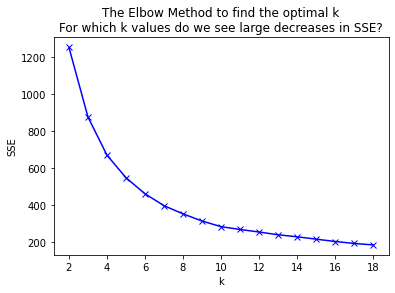

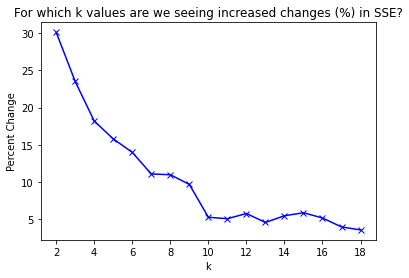

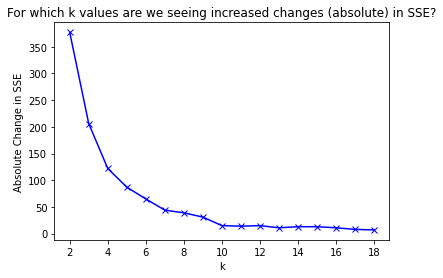

,k,sse,delta,pct_delta
0,2,1253.742992,377.0,30.1
1,3,876.980769,206.0,23.5
2,4,670.503549,122.0,18.2
3,5,548.391273,87.0,15.8
4,6,461.884556,65.0,14.0
5,7,397.136802,44.0,11.1
6,8,353.123074,39.0,11.0
7,9,314.388680,31.0,9.7
8,10,283.866632,15.0,5.3
9,11,268.778201,14.0,5.1


In [24]:
find_k(X[0], cluster_vars, k_range)

In [25]:
k = 5
# as reminders: 
cluster_vars = ['scaled_lat', 'scaled_lon', 'house_age_bin']
cluster_name = 'area_cluster'

In [26]:
def create_clusters(X_train, k, cluster_vars):
    # create kmean object
    kmeans = KMeans(n_clusters=k, random_state = 13)

    # fit to train and assign cluster ids to observations
    kmeans.fit(X_train[cluster_vars])

    return kmeans

In [27]:
kmeans = create_clusters(X[0], k, cluster_vars)

In [28]:
# get the centroids for each distinct cluster...

def get_centroids(kmeans, cluster_vars, cluster_name):
    # get the centroids for each distinct cluster...

    centroid_col_names = ['centroid_' + i for i in cluster_vars]

    centroid_df = pd.DataFrame(kmeans.cluster_centers_, 
                               columns=centroid_col_names).reset_index().rename(columns={'index': cluster_name})

    return centroid_df

In [29]:
centroid_df = get_centroids(kmeans, cluster_vars, cluster_name)

In [30]:
# label cluster for each observation in X_train (X[0] in our X list of dataframes), 
# X_validate (X[1]), & X_test (X[2])

def assign_clusters(kmeans, cluster_vars, cluster_name, centroid_df):
    for i in range(len(X)):
        clusters = pd.DataFrame(kmeans.predict(X[i][cluster_vars]), 
                            columns=[cluster_name], index=X[i].index)

        clusters_centroids = clusters.merge(centroid_df, on=cluster_name, copy=False).set_index(clusters.index.values)

        X[i] = pd.concat([X[i], clusters_centroids], axis=1)
    return X


In [31]:
X = assign_clusters(kmeans, cluster_vars, cluster_name, centroid_df)

In [32]:
pd.DataFrame(X[0].groupby(['area_cluster', 'centroid_scaled_lat', 'centroid_scaled_lon', 
                           'centroid_house_age_bin'])['area_cluster'].count())

,,,,area_cluster
area_cluster,centroid_scaled_lat,centroid_scaled_lon,centroid_house_age_bin,
0,0.918069,0.686900,0.229156,1743
1,0.411161,0.753882,0.426964,8715
2,0.553974,0.602872,0.547988,5852
3,0.664522,0.348307,0.321102,2984
4,0.239662,0.892914,0.256627,3703


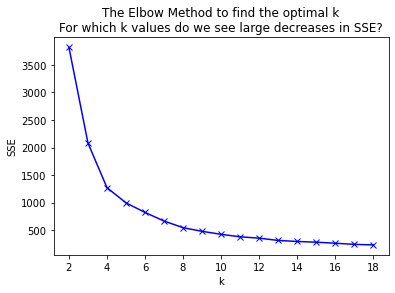

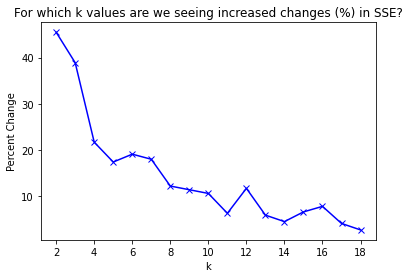

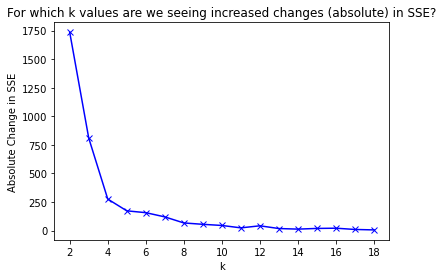

,k,sse,delta,pct_delta
0,2,3818.195793,1736.0,45.5
1,3,2082.325960,810.0,38.9
2,4,1272.188090,276.0,21.7
3,5,996.175031,173.0,17.4
4,6,823.124796,157.0,19.1
5,7,666.283318,120.0,18.0
6,8,546.598587,67.0,12.2
7,9,480.039175,55.0,11.4
8,10,425.449804,45.0,10.6
9,11,380.506942,24.0,6.3


In [33]:
cluster_vars = ['scaled_bathrooms', 'tot_sqft_bin', 'acres_bin', 'bed_bath_ratio']
cluster_name = 'size_cluster'
k_range = range(2,20)

find_k(X[0], cluster_vars, k_range)

In [34]:
k=6
cluster_name = 'size_cluster'
cluster_vars = ['scaled_bathrooms', 'tot_sqft_bin', 'acres_bin', 'bed_bath_ratio']

# fit kmeans 
kmeans = create_clusters(X[0], k, cluster_vars)

# get centroid values per variable per cluster
centroid_df = get_centroids(kmeans, cluster_vars, cluster_name)

# get cluster assignments and append those with centroids for each X partition (train, validate, test)
X = assign_clusters(kmeans, cluster_vars, cluster_name, centroid_df)

In [37]:
pd.DataFrame(X[0].groupby(['size_cluster', 'centroid_scaled_bathrooms', 'centroid_tot_sqft_bin',
                              'centroid_acres_bin', 'centroid_bed_bath_ratio'])['area_cluster'].count())

,,,,,area_cluster
size_cluster,centroid_scaled_bathrooms,centroid_tot_sqft_bin,centroid_acres_bin,centroid_bed_bath_ratio,
0,5.137232e-01,0.530947,0.160992,1.383475,3771
1,2.446245e-01,0.377535,0.164602,2.030969,3116
2,-7.216450e-16,0.221793,0.132666,3.071531,2097
3,2.532042e-01,0.322169,0.151676,1.501901,7100
4,-7.771561e-16,0.134880,0.111949,2.000000,2586
5,4.611740e-01,0.425399,0.124520,0.975738,4327


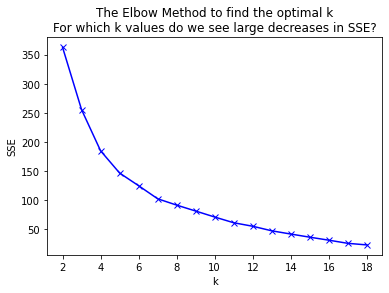

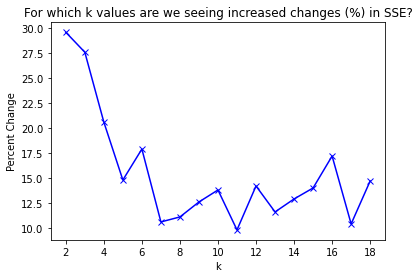

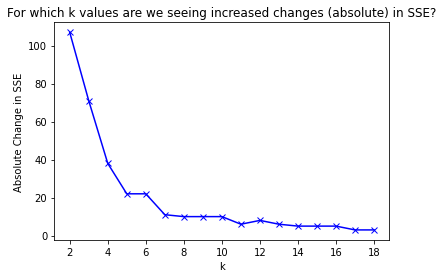

,k,sse,delta,pct_delta
0,2,362.553605,107.0,29.6
1,3,255.414817,71.0,27.6
2,4,184.816095,38.0,20.6
3,5,146.664327,22.0,14.8
4,6,124.909985,22.0,17.9
5,7,102.493641,11.0,10.6
6,8,91.633497,10.0,11.1
7,9,81.445855,10.0,12.6
8,10,71.169398,10.0,13.8
9,11,61.341966,6.0,9.8


In [38]:
cluster_vars = ['scaled_taxrate', 'structure_dollar_sqft_bin', 'land_dollar_sqft_bin']
cluster_name = 'price_cluster'
k_range = range(2,20)

find_k(X[0], cluster_vars, k_range)

In [39]:
k=6
cluster_name = 'price_cluster'
cluster_vars = ['scaled_taxrate', 'structure_dollar_sqft_bin', 'land_dollar_sqft_bin']

# fit kmeans 
kmeans = create_clusters(X[0], k, cluster_vars)

# get centroid values per variable per cluster
centroid_df = get_centroids(kmeans, cluster_vars, cluster_name)

# get cluster assignments and append those with centroids for each X partition (train, validate, test)
X = assign_clusters(kmeans, cluster_vars, cluster_name, centroid_df)

In [40]:
pd.DataFrame(X[0].groupby(['price_cluster', 'centroid_scaled_taxrate', 'centroid_structure_dollar_sqft_bin',
                           'centroid_land_dollar_sqft_bin'])['area_cluster'].count())

,,,,area_cluster
price_cluster,centroid_scaled_taxrate,centroid_structure_dollar_sqft_bin,centroid_land_dollar_sqft_bin,
0,0.034165,0.441956,0.414495,3201
1,0.047735,0.073752,0.136981,4286
2,0.036003,0.161509,0.311384,3180
3,0.043470,0.212036,0.162764,2127
4,0.036901,0.350398,0.262450,6530
5,0.033526,0.249251,0.424884,3673


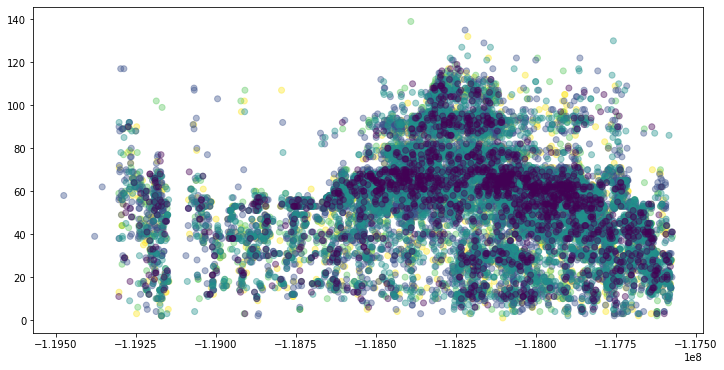

In [45]:
plt.figure(figsize=(12,6))
# plt.scatter(y=X_train.latitude, x=X_train.longitude, c=X_train.area_cluster, alpha=.4)
plt.scatter(y=X[0].house_age, x=X[0].lon, c=X[0].area_cluster, alpha=.4)


In [44]:
X[0].columns

Index(['bathrooms', 'tot_sqft', 'lat', 'lon', 'house_age', 'house_age_bin',
       'taxrate', 'acres', 'acres_bin', 'tot_sqft_bin',
       'structure_dollar_sqft_bin', 'land_dollar_sqft_bin', 'bed_bath_ratio',
       'incity_la', 'Los Angeles County', 'Orange County', 'Ventura County',
       'scaled_lat', 'scaled_lon', 'scaled_bathrooms', 'scaled_taxrate',
       'area_cluster', 'centroid_scaled_lat', 'centroid_scaled_lon',
       'centroid_house_age_bin', 'size_cluster', 'centroid_scaled_bathrooms',
       'centroid_tot_sqft_bin', 'centroid_acres_bin',
       'centroid_bed_bath_ratio', 'price_cluster', 'centroid_scaled_taxrate',
       'centroid_structure_dollar_sqft_bin', 'centroid_land_dollar_sqft_bin'],
      dtype='object')

Text(0.5, 1.0, 'Do clusters reveal differences in age and error?')

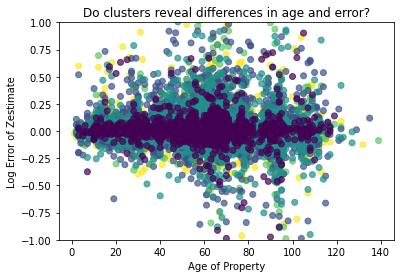

In [47]:
y_train = partitions[-3]

plt.scatter(y=y_train.logerror, x=X[0].house_age, c=X[0].area_cluster, alpha=.7)
plt.ylim(-1,1)
plt.xlabel('Age of Property')
plt.ylabel('Log Error of Zestimate')
plt.title("Do clusters reveal differences in age and error?")


In [55]:
X[0].shape

(22997, 34)

In [58]:
X_validate

NameError: name 'X_validate' is not defined

In [50]:
# update datatypes of binned values to be float
X_train = X_train.astype({'size_cluster': 'category', 'area_cluster': 'category'})


KeyError: "Only a column name can be used for the key in a dtype mappings argument. 'size_cluster' not found in columns."